In [ ]:
pip install rasterio numpy matplotlib

In [ ]:
!pip install earthpy
from glob import glob

import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep

import rasterio as rio
from rasterio.plot import plotting_extent
from rasterio.plot import show
from rasterio.plot import reshape_as_raster, reshape_as_image

import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap

np.seterr(divide='ignore', invalid='ignore')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 17.7 MB/s eta 0:00:00


{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# Load Bands
band2 = rasterio.open('Landsat8_Godavari_2014_8SR_B2.tif')  # Blue band
band3 = rasterio.open('Landsat8_Godavari_2014_8SR_B3.tif')  # Green band
band4 = rasterio.open('Landsat8_Godavari_2014_8SR_B4.tif')  # Red band
band5 = rasterio.open('Landsat8_Godavari_2014_8SR_B5.tif')  # NIR band
band6 = rasterio.open('Landsat8_Godavari_2014_8SR_B6.tif')  # SWIR1 band
band7 = rasterio.open('Landsat8_Godavari_2014_8SR_B7.tif')  # SWIR2 band

# Read bands as arrays
b2 = band2.read(1).astype('float32')
b3 = band3.read(1).astype('float32')
b4 = band4.read(1).astype('float32')
b5 = band5.read(1).astype('float32')
b6 = band6.read(1).astype('float32')
b7 = band7.read(1).astype('float32')

In [ ]:
l=[]
l.append(b2)
l.append(b3)
l.append(b4)
l.append(b5)
l.append(b6)
l.append(b7)
arr_bef = np.stack(l)
arr_bef.shape

(6, 501, 501)

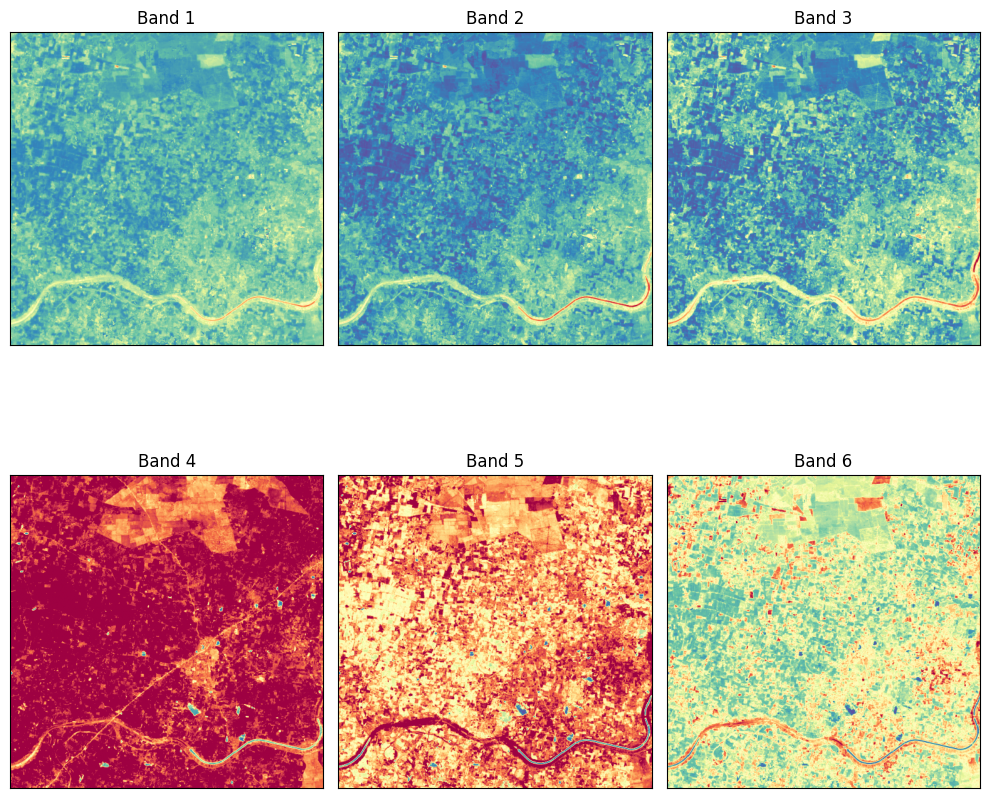

In [ ]:
# Clip reflectance for better visualization (only for plotting, not analysis)
arr_vis = np.clip(arr_bef, 0, 0.3)

# Plot individual bands with contrast enhancement
ep.plot_bands(arr_vis, cmap='Spectral_r', cols=3, figsize=(10, 10), cbar=False)
plt.show()

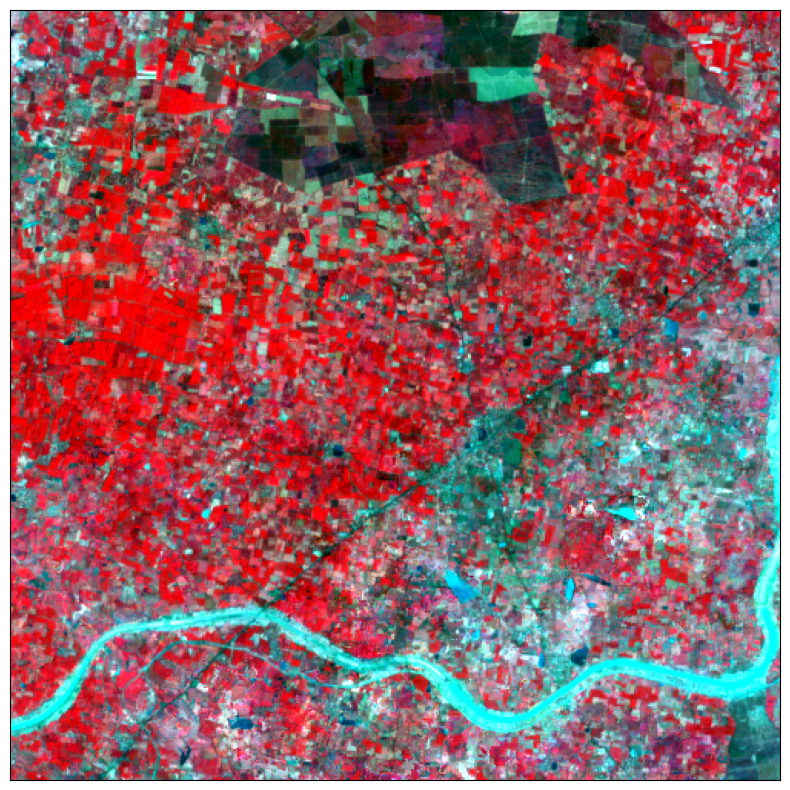

In [ ]:
# True color composite (Bands 4,3,2) with stretching
ep.plot_rgb(arr_bef, rgb=(3, 2, 1), figsize=(10, 10), stretch=True)
plt.show()

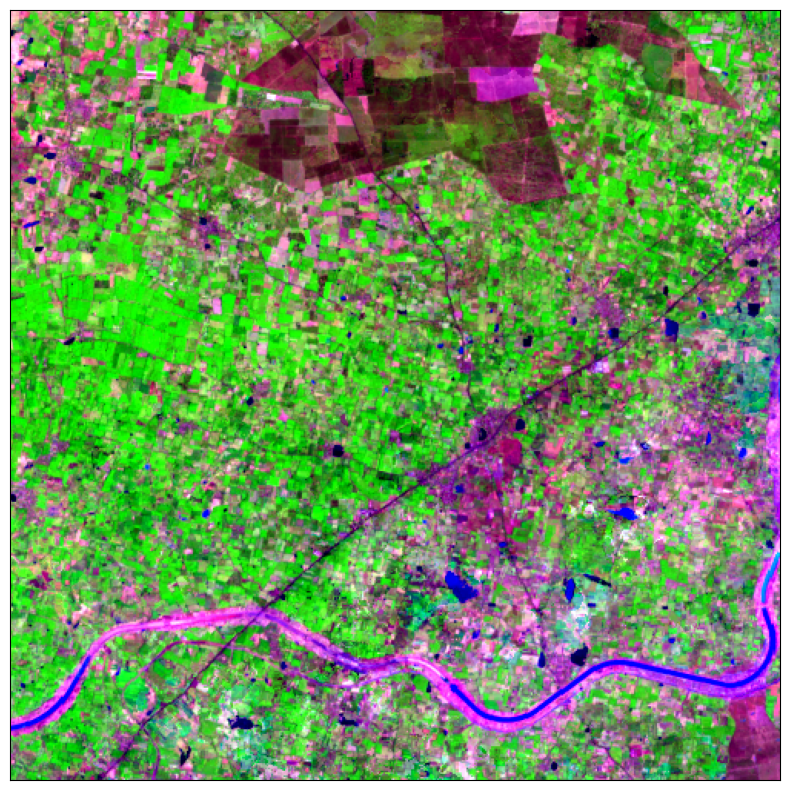

In [ ]:
# False color composite (Bands 5,4,3) highlights vegetation
ep.plot_rgb(arr_bef, rgb=(4, 3, 2), figsize=(10, 10), stretch=True)
plt.show()

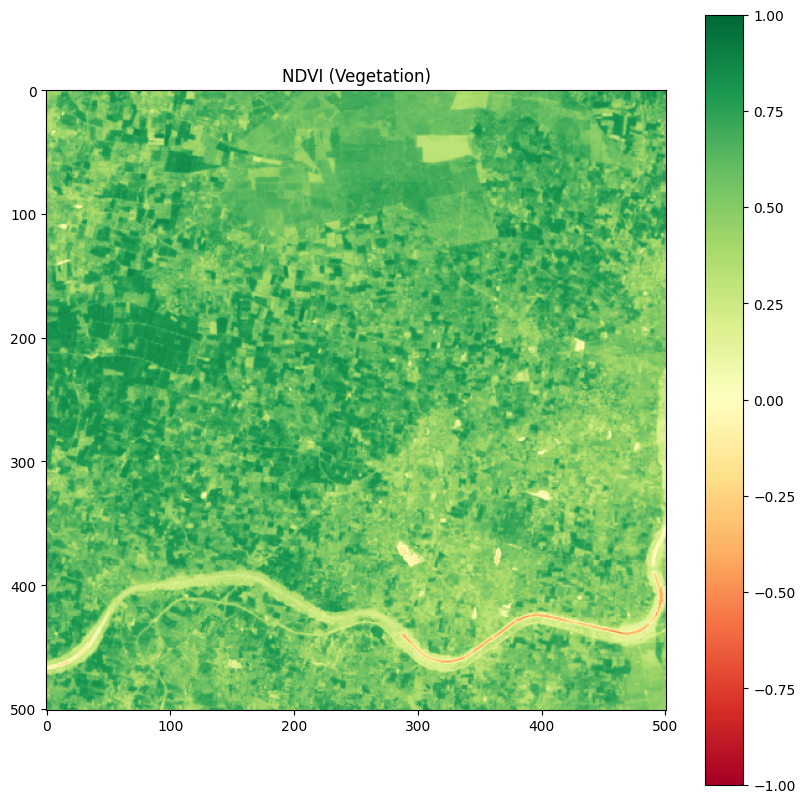

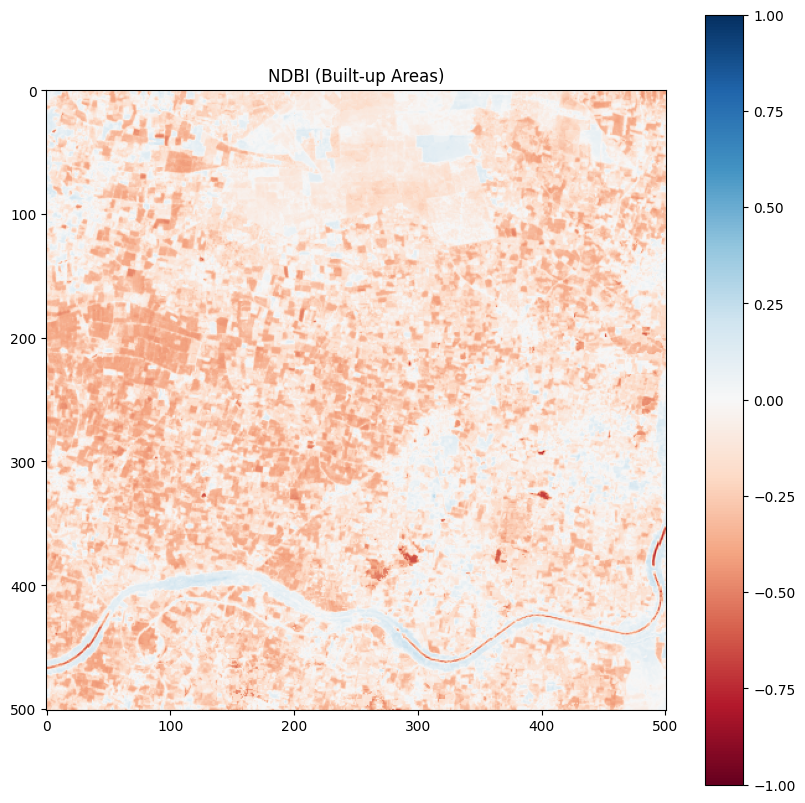

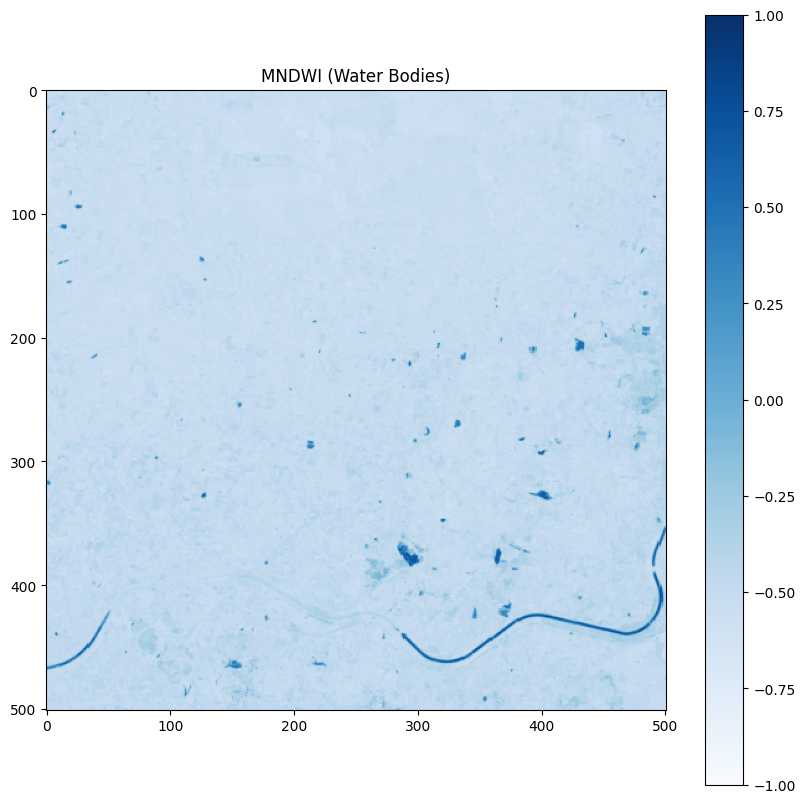

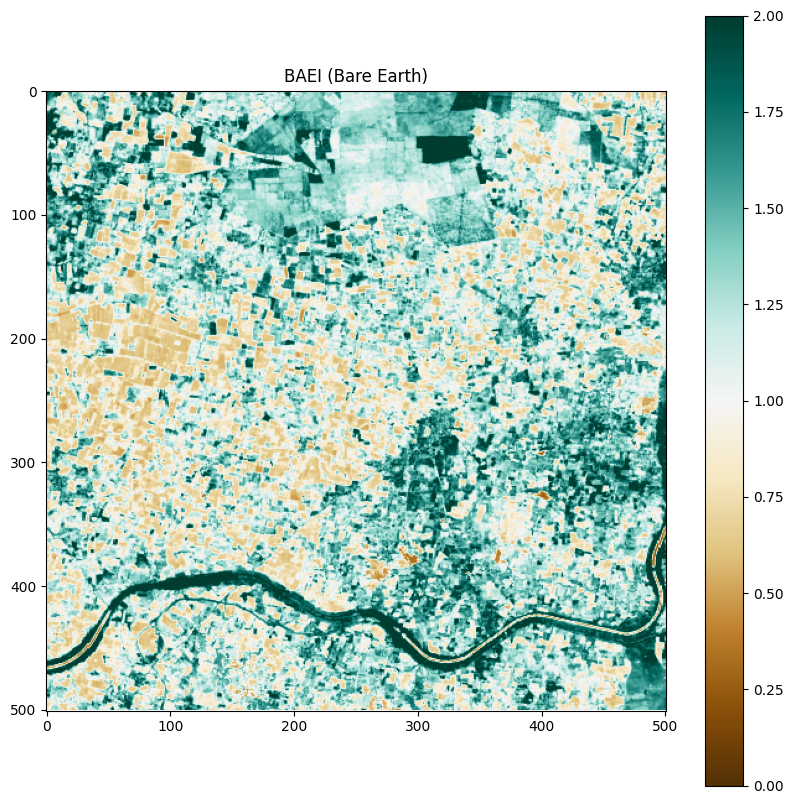

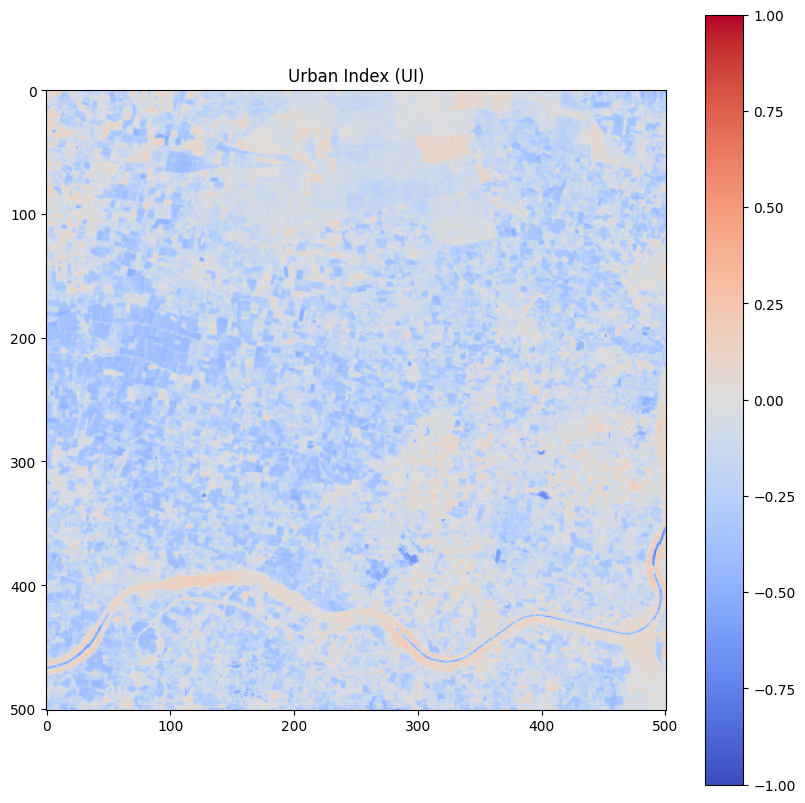

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# -------------------------
# Helper function to plot indices
# -------------------------
def plot_index(index_array, title, cmap, vmin=-1, vmax=1):
    plt.figure(figsize=(10, 10))
    plt.imshow(index_array, cmap=cmap, vmin=vmin, vmax=vmax)
    plt.colorbar()
    plt.title(title)
    plt.show()

# -------------------------
# Compute NDVI
# -------------------------
ndvi = (b5 - b4) / (b5 + b4 + 1e-10)
ndvi = np.clip(ndvi, -1, 1)
plot_index(ndvi, "NDVI (Vegetation)", cmap="RdYlGn")

# -------------------------
# Compute NDBI
# -------------------------
ndbi = (b6 - b5) / (b6 + b5 + 1e-10)
ndbi = np.clip(ndbi, -1, 1)
plot_index(ndbi, "NDBI (Built-up Areas)", cmap="RdBu")

# -------------------------
# Compute MNDWI
# -------------------------
mndwi = (b3 - b6) / (b3 + b6 + 1e-10)
mndwi = np.clip(mndwi, -1, 1)
plot_index(mndwi, "MNDWI (Water Bodies)", cmap="Blues")

# -------------------------
# Compute BAEI
# -------------------------
baei = (b6 + b7) / (b5 + 1e-10)
# BAEI can exceed -1..1, so we normalize it for visualization only
baei_vis = np.clip(baei, 0, 2)
plot_index(baei_vis, "BAEI (Bare Earth)", cmap="BrBG", vmin=0, vmax=2)

# -------------------------
# Compute Urban Index (UI)
# -------------------------
ui = (b6 - b5) / (b6 + b5 + 1e-10)
ui = np.clip(ui, -1, 1)
plot_index(ui, "Urban Index (UI)", cmap="coolwarm")


Year-to-Year Urbanization Changes:
Urbanization change from 2014 to 2015: 5.82%
Urbanization change from 2015 to 2016: -11.47%
Urbanization change from 2016 to 2017: 2.34%
Urbanization change from 2017 to 2018: -7.96%
Urbanization change from 2018 to 2019: 23.26%
Urbanization change from 2019 to 2020: -12.35%
Urbanization change from 2020 to 2021: -12.99%
Urbanization change from 2021 to 2022: -10.79%
Urbanization change from 2022 to 2023: 8.78%
Urbanization change from 2023 to 2024: 36.87%

Cumulative Urbanization Changes from 2014:
Urbanization change from 2014 to 2014: 0.00%
Urbanization change from 2014 to 2015: 5.82%
Urbanization change from 2014 to 2016: -5.65%
Urbanization change from 2014 to 2017: -3.31%
Urbanization change from 2014 to 2018: -11.27%
Urbanization change from 2014 to 2019: 11.99%
Urbanization change from 2014 to 2020: -0.36%
Urbanization change from 2014 to 2021: -13.35%
Urbanization change from 2014 to 2022: -24.15%
Urbanization change from 2014 to 2023: -15.3

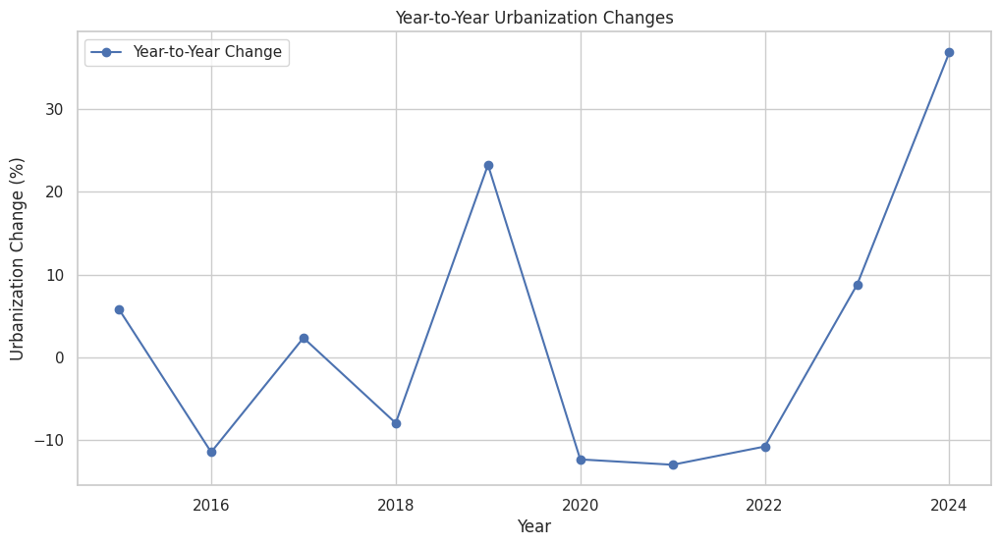

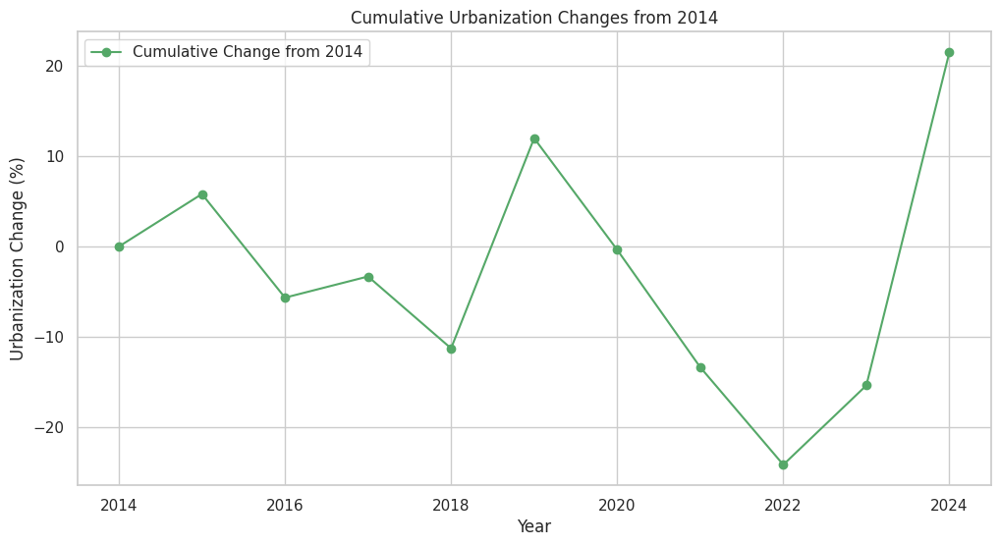

In [ ]:
import numpy as np
import rasterio
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# List of years
years = range(2014, 2025)

# ----------------------------
# Function to compute indices
# ----------------------------
def compute_indices(b2, b3, b4, b5, b6, b7):
    ndvi = (b5 - b4) / (b5 + b4 + 1e-10)
    ndbi = (b6 - b5) / (b6 + b5 + 1e-10)
    mndwi = (b3 - b6) / (b3 + b6 + 1e-10)
    baei = (b6 + b7) / (b5 + 1e-10)
    ui = (b6 - b5) / (b6 + b5 + 1e-10)
    return ndvi, ndbi, mndwi, baei, ui

# ----------------------------
# Compute indices per year
# ----------------------------
indices_data = {}
shapes = {}

for year in years:
    # Load bands
    band2 = rasterio.open(f"Landsat8_Godavari_{year}_8SR_B2.tif")  # Blue
    band3 = rasterio.open(f"Landsat8_Godavari_{year}_8SR_B3.tif")  # Green
    band4 = rasterio.open(f"Landsat8_Godavari_{year}_8SR_B4.tif")  # Red
    band5 = rasterio.open(f"Landsat8_Godavari_{year}_8SR_B5.tif")  # NIR
    band6 = rasterio.open(f"Landsat8_Godavari_{year}_8SR_B6.tif")  # SWIR1
    band7 = rasterio.open(f"Landsat8_Godavari_{year}_8SR_B7.tif")  # SWIR2

    # Read bands
    b2 = band2.read(1).astype("float32")
    b3 = band3.read(1).astype("float32")
    b4 = band4.read(1).astype("float32")
    b5 = band5.read(1).astype("float32")
    b6 = band6.read(1).astype("float32")
    b7 = band7.read(1).astype("float32")

    # Compute indices
    ndvi, ndbi, mndwi, baei, ui = compute_indices(b2, b3, b4, b5, b6, b7)

    # Store results
    indices_data[year] = {"NDVI": ndvi, "NDBI": ndbi, "MNDWI": mndwi, "BAEI": baei, "UI": ui}
    shapes[year] = ndvi.shape  # save original dimensions

# ----------------------------
# Prepare data for clustering
# ----------------------------
all_indices = []
year_slices = {}

start = 0
for year in years:
    data = np.stack([
        indices_data[year]["NDVI"].flatten(),
        indices_data[year]["NDBI"].flatten(),
        indices_data[year]["MNDWI"].flatten(),
        indices_data[year]["BAEI"].flatten(),
        indices_data[year]["UI"].flatten()
    ], axis=1)

    end = start + data.shape[0]
    year_slices[year] = (start, end)
    all_indices.append(data)
    start = end

all_indices = np.vstack(all_indices)

# ----------------------------
# Run KMeans clustering
# ----------------------------
kmeans = KMeans(n_clusters=2, random_state=0)
kmeans_labels = kmeans.fit_predict(all_indices)

# ----------------------------
# Fix cluster meaning
# ----------------------------
cluster_means = []
for c in range(2):
    cluster_mask = (kmeans_labels == c)
    mean_ndbi = np.mean(all_indices[cluster_mask, 1])  # column 1 = NDBI
    cluster_means.append(mean_ndbi)

urban_cluster = np.argmax(cluster_means)  # the cluster with higher NDBI

# ----------------------------
# Reshape labels per year
# ----------------------------
urban_areas = {}
for year in years:
    start, end = year_slices[year]
    reshaped_labels = (kmeans_labels[start:end].reshape(shapes[year]) == urban_cluster).astype(int)
    urban_areas[year] = reshaped_labels

# ----------------------------
# Urbanization change analysis
# ----------------------------
urban_change_percentages_relative = []
urban_change_percentages_cumulative = []
base_year = 2014
base_urban_area = np.sum(urban_areas[base_year] == 1)
total_pixels = urban_areas[base_year].size

# Cumulative changes from 2014
for year in years:
    urban_area = np.sum(urban_areas[year] == 1)
    urban_percentage = (urban_area / total_pixels) * 100
    base_urban_percentage = (base_urban_area / total_pixels) * 100
    change_percentage = urban_percentage - base_urban_percentage
    urban_change_percentages_cumulative.append((year, change_percentage))

# Year-to-year changes
for i in range(1, len(years)):
    year1 = years[i - 1]
    year2 = years[i]

    urban_area_1 = np.sum(urban_areas[year1] == 1)
    urban_area_2 = np.sum(urban_areas[year2] == 1)

    urban_percentage_1 = (urban_area_1 / total_pixels) * 100
    urban_percentage_2 = (urban_area_2 / total_pixels) * 100

    change_percentage = urban_percentage_2 - urban_percentage_1
    urban_change_percentages_relative.append((year1, year2, change_percentage))

# ----------------------------
# Display results
# ----------------------------
print("\nYear-to-Year Urbanization Changes:")
for year1, year2, change in urban_change_percentages_relative:
    print(f"Urbanization change from {year1} to {year2}: {change:.2f}%")

print("\nCumulative Urbanization Changes from 2014:")
for year, change in urban_change_percentages_cumulative:
    print(f"Urbanization change from 2014 to {year}: {change:.2f}%")

# ----------------------------
# Visualization
# ----------------------------
sns.set(style="whitegrid")

# Year-to-year changes
years_relative = [year2 for year1, year2, _ in urban_change_percentages_relative]
changes_relative = [change for _, _, change in urban_change_percentages_relative]

plt.figure(figsize=(12, 6))
plt.plot(years_relative, changes_relative, marker="o", linestyle="-", color="b", label="Year-to-Year Change")
plt.title("Year-to-Year Urbanization Changes")
plt.xlabel("Year")
plt.ylabel("Urbanization Change (%)")
plt.grid(True)
plt.legend()
plt.show()

# Cumulative changes
years_cumulative = [year for year, _ in urban_change_percentages_cumulative]
changes_cumulative = [change for _, change in urban_change_percentages_cumulative]

plt.figure(figsize=(12, 6))
plt.plot(years_cumulative, changes_cumulative, marker="o", linestyle="-", color="g", label="Cumulative Change from 2014")
plt.title("Cumulative Urbanization Changes from 2014")
plt.xlabel("Year")
plt.ylabel("Urbanization Change (%)")
plt.grid(True)
plt.legend()
plt.show()

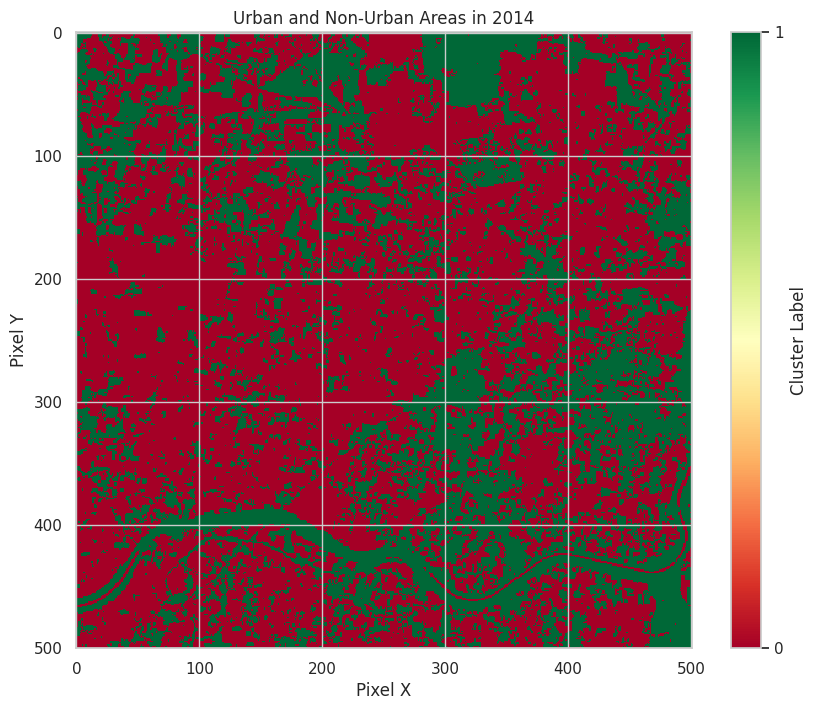

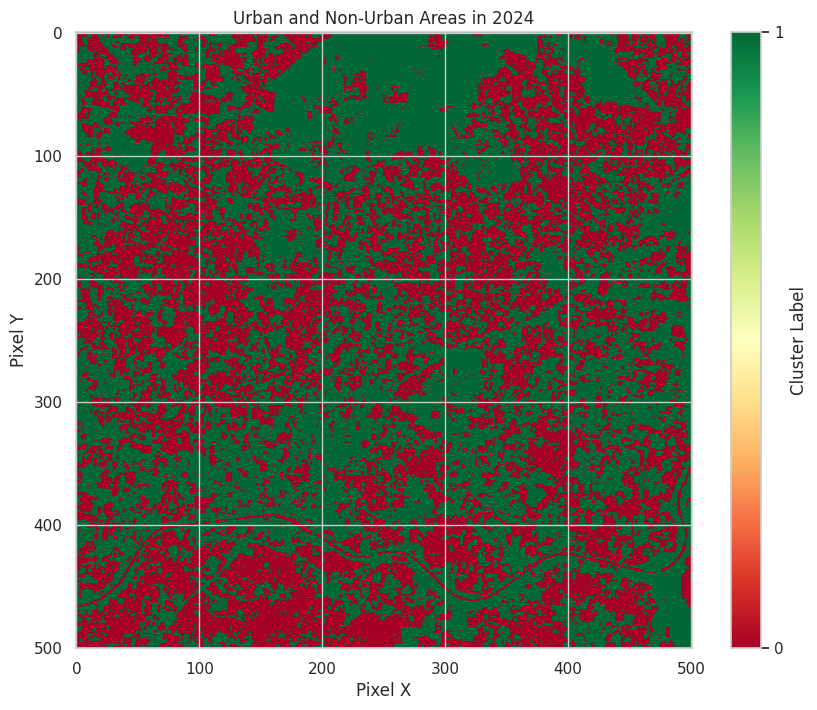

In [ ]:
import numpy as np
import rasterio
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Years to process
years = [2014, 2024]

# Function to compute indices
def compute_indices(b2, b3, b4, b5, b6, b7):
    ndvi = (b5 - b4) / (b5 + b4 + 1e-10)
    ndbi = (b6 - b5) / (b6 + b5 + 1e-10)
    mndwi = (b3 - b6) / (b3 + b6 + 1e-10)
    baei = (b6 + b7) / (b5 + 1e-10)
    ui = (b6 - b5) / (b6 + b5 + 1e-10)
    return ndvi, ndbi, mndwi, baei, ui

# Dictionary to store computed indices
indices_data = {}

# -----------------------------
# Load bands, compute indices
# -----------------------------
for year in years:
    # Open bands
    band2 = rasterio.open(f'Landsat8_Godavari_{year}_8SR_B2.tif')  # Blue
    band3 = rasterio.open(f'Landsat8_Godavari_{year}_8SR_B3.tif')  # Green
    band4 = rasterio.open(f'Landsat8_Godavari_{year}_8SR_B4.tif')  # Red
    band5 = rasterio.open(f'Landsat8_Godavari_{year}_8SR_B5.tif')  # NIR
    band6 = rasterio.open(f'Landsat8_Godavari_{year}_8SR_B6.tif')  # SWIR1
    band7 = rasterio.open(f'Landsat8_Godavari_{year}_8SR_B7.tif')  # SWIR2

    # Read as arrays
    b2 = band2.read(1).astype('float32')
    b3 = band3.read(1).astype('float32')
    b4 = band4.read(1).astype('float32')
    b5 = band5.read(1).astype('float32')
    b6 = band6.read(1).astype('float32')
    b7 = band7.read(1).astype('float32')

    # Compute indices
    ndvi, ndbi, mndwi, baei, ui = compute_indices(b2, b3, b4, b5, b6, b7)

    # Store
    indices_data[year] = {
        'NDVI': ndvi,
        'NDBI': ndbi,
        'MNDWI': mndwi,
        'BAEI': baei,
        'UI': ui
    }

# -----------------------------
# Prepare data for K-means
# -----------------------------
all_indices = []
year_slices = {}
start = 0

for year in years:
    data = np.stack([
        indices_data[year]['NDVI'].flatten(),
        indices_data[year]['NDBI'].flatten(),
        indices_data[year]['MNDWI'].flatten(),
        indices_data[year]['BAEI'].flatten(),
        indices_data[year]['UI'].flatten()
    ], axis=1)

    end = start + data.shape[0]
    year_slices[year] = (start, end)
    all_indices.append(data)
    start = end

all_indices = np.vstack(all_indices)

# -----------------------------
# Run K-means clustering
# -----------------------------
kmeans = KMeans(n_clusters=2, random_state=0)
kmeans_labels = kmeans.fit_predict(all_indices)

# Identify which cluster corresponds to urban areas (higher NDBI)
cluster_means = [np.mean(all_indices[kmeans_labels==i, 1]) for i in range(2)]
urban_cluster = np.argmax(cluster_means)

# -----------------------------
# Reshape labels for each year
# -----------------------------
urban_areas = {}
for year in years:
    start, end = year_slices[year]
    reshaped_labels = (kmeans_labels[start:end].reshape(indices_data[year]['NDVI'].shape) == urban_cluster).astype(int)
    urban_areas[year] = reshaped_labels

# -----------------------------
# Visualization
# -----------------------------
def plot_clustered_areas(year, urban_areas, title, cmap='RdYlGn'):
    plt.figure(figsize=(10, 8))
    plt.imshow(urban_areas[year], cmap=cmap, interpolation='nearest')
    plt.colorbar(label='Cluster Label', ticks=[0, 1], format='%d')
    plt.title(title)
    plt.xlabel('Pixel X')
    plt.ylabel('Pixel Y')
    plt.show()

plot_clustered_areas(2014, urban_areas, "Urban and Non-Urban Areas in 2014")
plot_clustered_areas(2024, urban_areas, "Urban and Non-Urban Areas in 2024")

In [ ]:
pip install prophet

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 7.


Forecasted Year-to-Year Urbanization Change (2025-2030):
    year       yhat  yhat_lower  yhat_upper
10  2024  12.165877   -8.241164   30.231400
11  2025  13.993429   -5.878465   32.907874
12  2026  15.820980   -3.684531   35.088652
13  2027  17.648532   -0.980860   36.888223
14  2028  19.481090   -0.016580   38.382706
15  2029  21.308642    2.725308   39.944461


/usr/local/lib/python3.12/dist-packages/prophet/forecaster.py:1872: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  dates = pd.date_range(


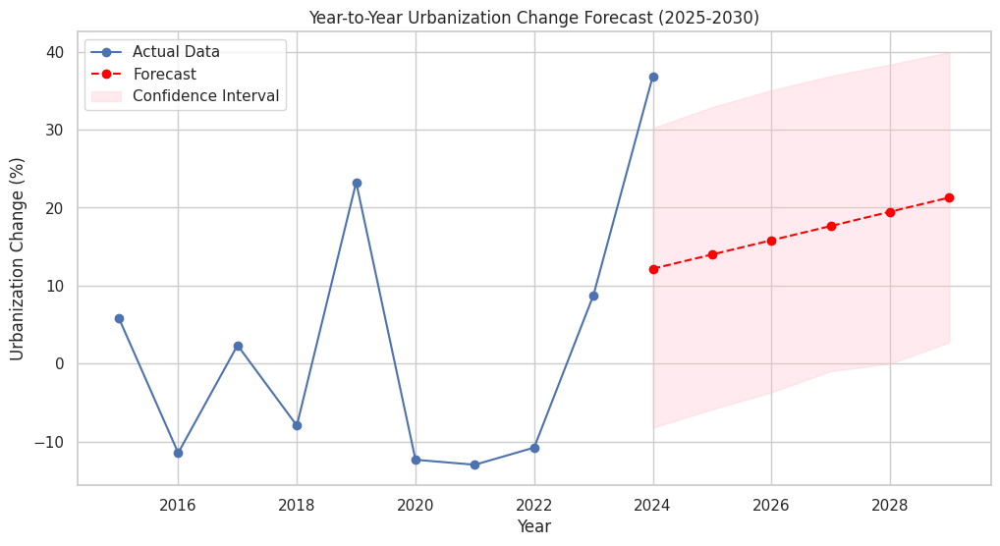

In [ ]:
# -------------------------------
# Urbanization Change Forecast using Prophet
# -------------------------------

import pandas as pd
from prophet import Prophet
import matplotlib.pyplot as plt

# -------------------------------
# Step 1: Prepare the year-to-year urbanization change data
# -------------------------------
data = {
    'year': [2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024],
    'urban_change_percent': [5.82, -11.47, 2.34, -7.96, 23.26, -12.35, -12.99, -10.79, 8.78, 36.87]
}

df = pd.DataFrame(data)

# Prophet requires columns 'ds' (date) and 'y' (value)
df_prophet = df.rename(columns={'year':'ds', 'urban_change_percent':'y'})
df_prophet['ds'] = pd.to_datetime(df_prophet['ds'], format='%Y')

# -------------------------------
# Step 2: Fit Prophet model
# -------------------------------
model = Prophet(yearly_seasonality=False, daily_seasonality=False)
model.fit(df_prophet)

# -------------------------------
# Step 3: Forecast future years (2025-2030)
# -------------------------------
future = model.make_future_dataframe(periods=6, freq='Y')
forecast = model.predict(future)

# Extract forecasted values for 2025-2030
forecast_future = forecast[['ds','yhat','yhat_lower','yhat_upper']].tail(6)
forecast_future['year'] = forecast_future['ds'].dt.year
forecast_future = forecast_future[['year','yhat','yhat_lower','yhat_upper']]

print("Forecasted Year-to-Year Urbanization Change (2025-2030):")
print(forecast_future)

# -------------------------------
# Step 4: Plot actual vs forecasted values
# -------------------------------
plt.figure(figsize=(12,6))

# Plot historical data
plt.plot(df['year'], df['urban_change_percent'], label='Actual Data', marker='o')

# Plot forecasted values
plt.plot(forecast_future['year'], forecast_future['yhat'], label='Forecast', marker='o', linestyle='--', color='red')

# Plot confidence interval
plt.fill_between(forecast_future['year'],
                 forecast_future['yhat_lower'],
                 forecast_future['yhat_upper'],
                 color='pink', alpha=0.3, label='Confidence Interval')

plt.title("Year-to-Year Urbanization Change Forecast (2025-2030)")
plt.xlabel("Year")
plt.ylabel("Urbanization Change (%)")
plt.legend()
plt.grid(True)
plt.show()

## **WORK ON ACCURACY**

In [ ]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, cohen_kappa_score
from sklearn.metrics import precision_score, recall_score, f1_score, classification_report
from sklearn.cluster import KMeans

In [ ]:
# -------------------------------
# Step 1: Load data for a specific year (e.g., 2024)
# -------------------------------
year = 2024

# Load bands
band2 = rasterio.open(f'Landsat8_Godavari_{year}_8SR_B2.tif')
band3 = rasterio.open(f'Landsat8_Godavari_{year}_8SR_B3.tif')
band4 = rasterio.open(f'Landsat8_Godavari_{year}_8SR_B4.tif')
band5 = rasterio.open(f'Landsat8_Godavari_{year}_8SR_B5.tif')
band6 = rasterio.open(f'Landsat8_Godavari_{year}_8SR_B6.tif')
band7 = rasterio.open(f'Landsat8_Godavari_{year}_8SR_B7.tif')

# Read as arrays
b2 = band2.read(1).astype('float32')
b3 = band3.read(1).astype('float32')
b4 = band4.read(1).astype('float32')
b5 = band5.read(1).astype('float32')
b6 = band6.read(1).astype('float32')
b7 = band7.read(1).astype('float32')

In [ ]:
# -------------------------------
# Step 2: Compute indices
# -------------------------------
def compute_indices(b2, b3, b4, b5, b6, b7):
    ndvi = (b5 - b4) / (b5 + b4 + 1e-10)
    ndbi = (b6 - b5) / (b6 + b5 + 1e-10)
    mndwi = (b3 - b6) / (b3 + b6 + 1e-10)
    baei = (b6 + b7) / (b5 + 1e-10)
    ui = (b6 - b5) / (b6 + b5 + 1e-10)
    return ndvi, ndbi, mndwi, baei, ui

ndvi, ndbi, mndwi, baei, ui = compute_indices(b2, b3, b4, b5, b6, b7)

In [ ]:
# -------------------------------
# Step 3: K-means classification (your method)
# -------------------------------
# Stack indices
data = np.stack([
    ndvi.flatten(),
    ndbi.flatten(),
    mndwi.flatten(),
    baei.flatten(),
    ui.flatten()
], axis=1)

# Run K-means
kmeans = KMeans(n_clusters=2, random_state=0)
kmeans_labels = kmeans.fit_predict(data)

# Identify urban cluster (higher NDBI)
cluster_means = [np.mean(data[kmeans_labels == i, 1]) for i in range(2)]
urban_cluster = np.argmax(cluster_means)

# Reshape to image
kmeans_urban = (kmeans_labels.reshape(ndvi.shape) == urban_cluster).astype(int)

In [ ]:
# -------------------------------
# Step 4: NDBI threshold classification (validation method)
# -------------------------------
# Threshold: NDBI > 0 means urban/built-up
ndbi_threshold_urban = (ndbi > 0).astype(int)

In [ ]:
# -------------------------------
# Step 5: Calculate accuracy metrics
# -------------------------------
# Flatten for comparison
kmeans_flat = kmeans_urban.flatten()
ndbi_flat = ndbi_threshold_urban.flatten()

# Confusion matrix
cm = confusion_matrix(ndbi_flat, kmeans_flat)

# Accuracy metrics
overall_accuracy = accuracy_score(ndbi_flat, kmeans_flat)
kappa = cohen_kappa_score(ndbi_flat, kmeans_flat)
precision = precision_score(ndbi_flat, kmeans_flat)
recall = recall_score(ndbi_flat, kmeans_flat)
f1 = f1_score(ndbi_flat, kmeans_flat)

# Print results
print(f"=== Accuracy Assessment for Year {year} ===\n")
print("Confusion Matrix:")
print("                 Predicted")
print("                 Non-Urban  Urban")
print(f"Actual Non-Urban    {cm[0,0]:6d}   {cm[0,1]:6d}")
print(f"Actual Urban        {cm[1,0]:6d}   {cm[1,1]:6d}\n")

print(f"Overall Accuracy: {overall_accuracy:.4f} ({overall_accuracy*100:.2f}%)")
print(f"Kappa Coefficient: {kappa:.4f}")
print(f"Precision (Urban): {precision:.4f}")
print(f"Recall (Urban): {recall:.4f}")
print(f"F1-Score: {f1:.4f}\n")

print("Classification Report:")
print(classification_report(ndbi_flat, kmeans_flat,
                          target_names=['Non-Urban', 'Urban'],
                          digits=4))

=== Accuracy Assessment for Year 2024 ===

Confusion Matrix:
                 Predicted
                 Non-Urban  Urban
Actual Non-Urban    145477    36382
Actual Urban             0    69142

Overall Accuracy: 0.8551 (85.51%)
Kappa Coefficient: 0.6878
Precision (Urban): 0.6552
Recall (Urban): 1.0000
F1-Score: 0.7917

Classification Report:
              precision    recall  f1-score   support

   Non-Urban     1.0000    0.7999    0.8889    181859
       Urban     0.6552    1.0000    0.7917     69142

    accuracy                         0.8551    251001
   macro avg     0.8276    0.9000    0.8403    251001
weighted avg     0.9050    0.8551    0.8621    251001



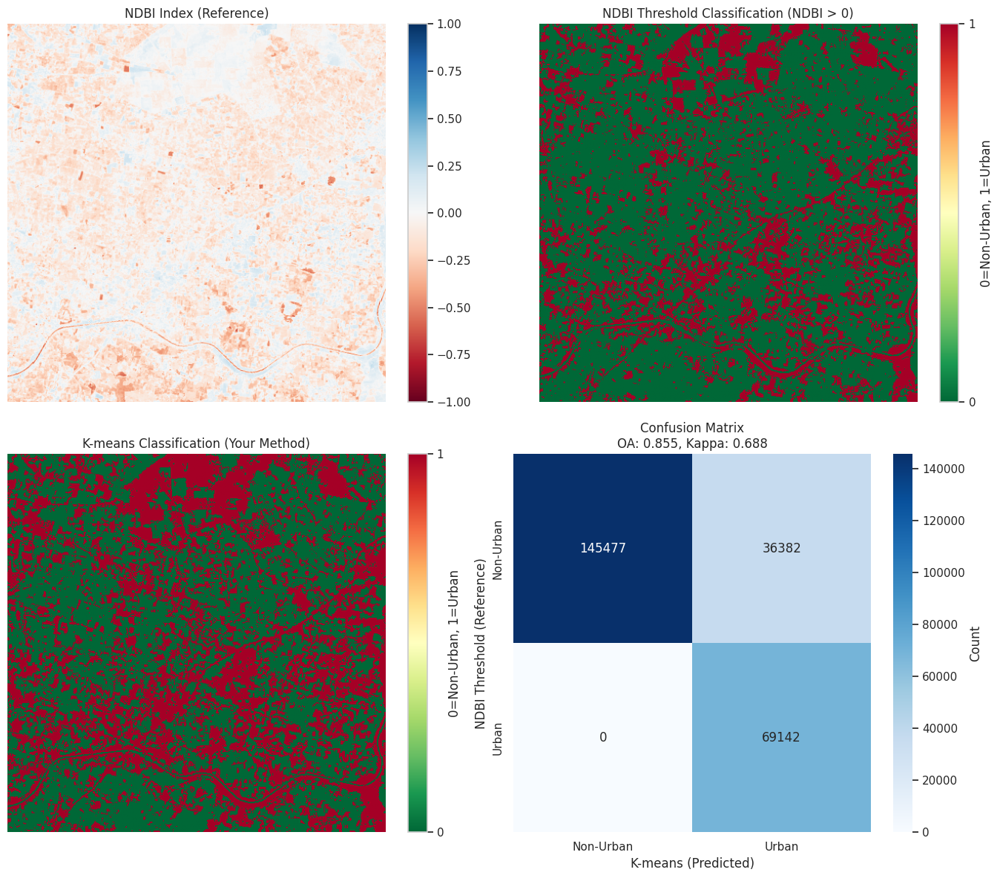

In [ ]:
# -------------------------------
# Step 6: Visualization
# -------------------------------
fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# Plot 1: NDBI index
im1 = axes[0, 0].imshow(ndbi, cmap='RdBu', vmin=-1, vmax=1)
axes[0, 0].set_title('NDBI Index (Reference)', fontsize=12)
axes[0, 0].axis('off')
plt.colorbar(im1, ax=axes[0, 0], fraction=0.046)

# Plot 2: NDBI threshold classification
im2 = axes[0, 1].imshow(ndbi_threshold_urban, cmap='RdYlGn_r', vmin=0, vmax=1)
axes[0, 1].set_title('NDBI Threshold Classification (NDBI > 0)', fontsize=12)
axes[0, 1].axis('off')
plt.colorbar(im2, ax=axes[0, 1], fraction=0.046, ticks=[0, 1],
             label='0=Non-Urban, 1=Urban')

# Plot 3: K-means classification
im3 = axes[1, 0].imshow(kmeans_urban, cmap='RdYlGn_r', vmin=0, vmax=1)
axes[1, 0].set_title('K-means Classification (Your Method)', fontsize=12)
axes[1, 0].axis('off')
plt.colorbar(im3, ax=axes[1, 0], fraction=0.046, ticks=[0, 1],
             label='0=Non-Urban, 1=Urban')

# Plot 4: Confusion matrix heatmap
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Non-Urban', 'Urban'],
            yticklabels=['Non-Urban', 'Urban'],
            ax=axes[1, 1], cbar_kws={'label': 'Count'})
axes[1, 1].set_title(f'Confusion Matrix\nOA: {overall_accuracy:.3f}, Kappa: {kappa:.3f}',
                     fontsize=12)
axes[1, 1].set_ylabel('NDBI Threshold (Reference)')
axes[1, 1].set_xlabel('K-means (Predicted)')

plt.tight_layout()
plt.show()

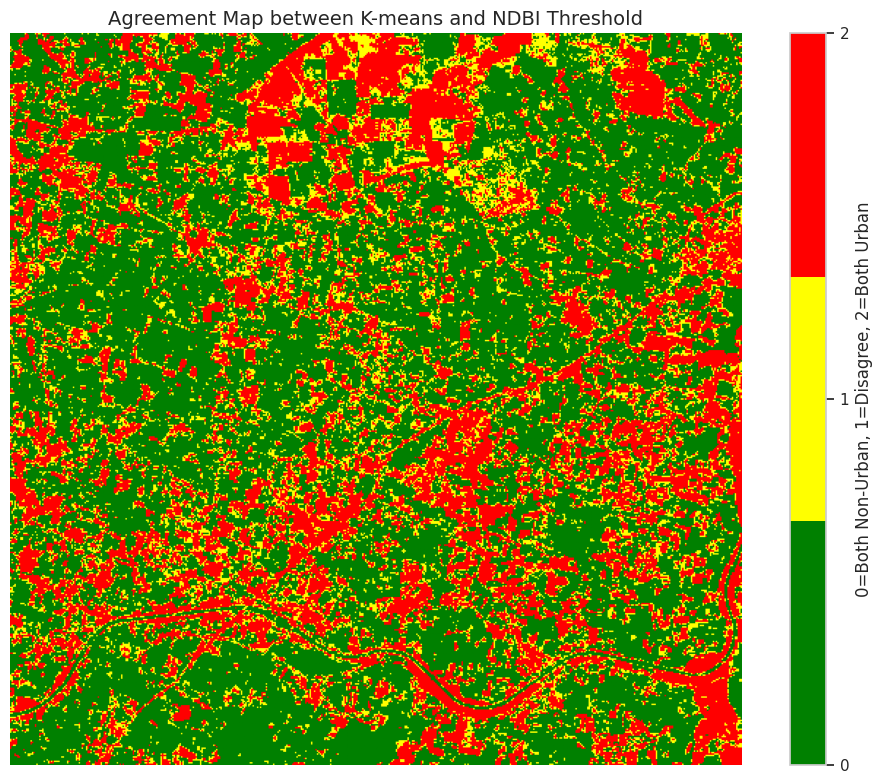


Spatial Agreement: 85.51%


In [ ]:
# -------------------------------
# Step 7: Agreement/Disagreement map
# -------------------------------
# Create agreement map: 0=both non-urban, 1=disagree, 2=both urban
agreement_map = np.zeros_like(kmeans_urban)
agreement_map[(kmeans_urban == 0) & (ndbi_threshold_urban == 0)] = 0  # Both non-urban
agreement_map[(kmeans_urban == 1) & (ndbi_threshold_urban == 1)] = 2  # Both urban
agreement_map[(kmeans_urban != ndbi_threshold_urban)] = 1  # Disagreement

plt.figure(figsize=(10, 8))
cmap_agreement = plt.cm.colors.ListedColormap(['green', 'yellow', 'red'])
im = plt.imshow(agreement_map, cmap=cmap_agreement, vmin=0, vmax=2)
plt.title('Agreement Map between K-means and NDBI Threshold', fontsize=14)
plt.colorbar(im, ticks=[0, 1, 2],
             label='0=Both Non-Urban, 1=Disagree, 2=Both Urban')
plt.axis('off')
plt.tight_layout()
plt.show()

# Calculate agreement percentage
total_pixels = agreement_map.size
agree_pixels = np.sum((agreement_map == 0) | (agreement_map == 2))
agreement_percent = (agree_pixels / total_pixels) * 100
print(f"\nSpatial Agreement: {agreement_percent:.2f}%")

# **ACCURACY FOR ALL YEARS**

In [ ]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.metrics import confusion_matrix, accuracy_score, cohen_kappa_score
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.cluster import KMeans

In [ ]:
# -------------------------------
# Function to compute indices
# -------------------------------
def compute_indices(b2, b3, b4, b5, b6, b7):
    ndvi = (b5 - b4) / (b5 + b4 + 1e-10)
    ndbi = (b6 - b5) / (b6 + b5 + 1e-10)
    mndwi = (b3 - b6) / (b3 + b6 + 1e-10)
    baei = (b6 + b7) / (b5 + 1e-10)
    ui = (b6 - b5) / (b6 + b5 + 1e-10)
    return ndvi, ndbi, mndwi, baei, ui

In [ ]:
# -------------------------------
# Function to perform validation for a single year
# -------------------------------
def validate_year(year):
    # Load bands
    band2 = rasterio.open(f'Landsat8_Godavari_{year}_8SR_B2.tif')
    band3 = rasterio.open(f'Landsat8_Godavari_{year}_8SR_B3.tif')
    band4 = rasterio.open(f'Landsat8_Godavari_{year}_8SR_B4.tif')
    band5 = rasterio.open(f'Landsat8_Godavari_{year}_8SR_B5.tif')
    band6 = rasterio.open(f'Landsat8_Godavari_{year}_8SR_B6.tif')
    band7 = rasterio.open(f'Landsat8_Godavari_{year}_8SR_B7.tif')

    # Read as arrays
    b2 = band2.read(1).astype('float32')
    b3 = band3.read(1).astype('float32')
    b4 = band4.read(1).astype('float32')
    b5 = band5.read(1).astype('float32')
    b6 = band6.read(1).astype('float32')
    b7 = band7.read(1).astype('float32')

    # Compute indices
    ndvi, ndbi, mndwi, baei, ui = compute_indices(b2, b3, b4, b5, b6, b7)

    # K-means classification
    data = np.stack([
        ndvi.flatten(),
        ndbi.flatten(),
        mndwi.flatten(),
        baei.flatten(),
        ui.flatten()
    ], axis=1)

    kmeans = KMeans(n_clusters=2, random_state=0)
    kmeans_labels = kmeans.fit_predict(data)

    # Identify urban cluster
    cluster_means = [np.mean(data[kmeans_labels == i, 1]) for i in range(2)]
    urban_cluster = np.argmax(cluster_means)

    kmeans_urban = (kmeans_labels.reshape(ndvi.shape) == urban_cluster).astype(int)

    # NDBI threshold classification
    ndbi_threshold_urban = (ndbi > 0).astype(int)

    # Calculate metrics
    kmeans_flat = kmeans_urban.flatten()
    ndbi_flat = ndbi_threshold_urban.flatten()

    cm = confusion_matrix(ndbi_flat, kmeans_flat)
    oa = accuracy_score(ndbi_flat, kmeans_flat)
    kappa = cohen_kappa_score(ndbi_flat, kmeans_flat)
    precision = precision_score(ndbi_flat, kmeans_flat, zero_division=0)
    recall = recall_score(ndbi_flat, kmeans_flat, zero_division=0)
    f1 = f1_score(ndbi_flat, kmeans_flat, zero_division=0)

    # Calculate Producer's and User's Accuracy
    producers_acc_urban = cm[1, 1] / (cm[1, 0] + cm[1, 1]) if (cm[1, 0] + cm[1, 1]) > 0 else 0
    users_acc_urban = cm[1, 1] / (cm[0, 1] + cm[1, 1]) if (cm[0, 1] + cm[1, 1]) > 0 else 0

    return {
        'Year': year,
        'Overall_Accuracy': oa,
        'Kappa': kappa,
        'Precision': precision,
        'Recall': recall,
        'F1_Score': f1,
        'Producers_Accuracy': producers_acc_urban,
        'Users_Accuracy': users_acc_urban,
        'True_Negative': cm[0, 0],
        'False_Positive': cm[0, 1],
        'False_Negative': cm[1, 0],
        'True_Positive': cm[1, 1]
    }

In [ ]:
# -------------------------------
# Run validation for all years
# -------------------------------
years = range(2014, 2025)
results = []

print("Processing validation for all years...\n")
for year in years:
    print(f"Validating year {year}...")
    result = validate_year(year)
    results.append(result)

Processing validation for all years...

Validating year 2014...
Validating year 2015...
Validating year 2016...
Validating year 2017...
Validating year 2018...
Validating year 2019...
Validating year 2020...
Validating year 2021...
Validating year 2022...
Validating year 2023...
Validating year 2024...


In [ ]:
# -------------------------------
# Create results DataFrame
# -------------------------------
results_df = pd.DataFrame(results)

In [ ]:
# Calculate average metrics
avg_metrics = {
    'Year': 'Average',
    'Overall_Accuracy': results_df['Overall_Accuracy'].mean(),
    'Kappa': results_df['Kappa'].mean(),
    'Precision': results_df['Precision'].mean(),
    'Recall': results_df['Recall'].mean(),
    'F1_Score': results_df['F1_Score'].mean(),
    'Producers_Accuracy': results_df['Producers_Accuracy'].mean(),
    'Users_Accuracy': results_df['Users_Accuracy'].mean(),
    'True_Negative': '-',
    'False_Positive': '-',
    'False_Negative': '-',
    'True_Positive': '-'
}

In [ ]:
# -------------------------------
# Display results
# -------------------------------
print("\n" + "="*80)
print("MULTI-YEAR ACCURACY ASSESSMENT RESULTS (2014-2024)")
print("="*80 + "\n")

# Display main metrics table
metrics_table = results_df[['Year', 'Overall_Accuracy', 'Kappa', 'Precision',
                             'Recall', 'F1_Score']].copy()
metrics_table['Overall_Accuracy'] = metrics_table['Overall_Accuracy'].apply(lambda x: f"{x:.4f}")
metrics_table['Kappa'] = metrics_table['Kappa'].apply(lambda x: f"{x:.4f}")
metrics_table['Precision'] = metrics_table['Precision'].apply(lambda x: f"{x:.4f}")
metrics_table['Recall'] = metrics_table['Recall'].apply(lambda x: f"{x:.4f}")
metrics_table['F1_Score'] = metrics_table['F1_Score'].apply(lambda x: f"{x:.4f}")

print(metrics_table.to_string(index=False))
print("\n" + "-"*80)
print(f"Average Overall Accuracy: {avg_metrics['Overall_Accuracy']:.4f} ({avg_metrics['Overall_Accuracy']*100:.2f}%)")
print(f"Average Kappa Coefficient: {avg_metrics['Kappa']:.4f}")
print(f"Average Precision (Urban): {avg_metrics['Precision']:.4f}")
print(f"Average Recall (Urban): {avg_metrics['Recall']:.4f}")
print(f"Average F1-Score: {avg_metrics['F1_Score']:.4f}")
print("-"*80 + "\n")

# Kappa interpretation
avg_kappa = avg_metrics['Kappa']
if avg_kappa > 0.80:
    interpretation = "Almost Perfect Agreement"
elif avg_kappa > 0.60:
    interpretation = "Substantial Agreement"
elif avg_kappa > 0.40:
    interpretation = "Moderate Agreement"
else:
    interpretation = "Fair Agreement"

print(f"Kappa Interpretation: {interpretation}\n")


MULTI-YEAR ACCURACY ASSESSMENT RESULTS (2014-2024)

 Year Overall_Accuracy  Kappa Precision Recall F1_Score
 2014           0.6635 0.2906    0.2770 1.0000   0.4339
 2015           0.7551 0.5000    0.4905 1.0000   0.6581
 2016           0.7549 0.4332    0.3897 1.0000   0.5608
 2017           0.6966 0.3374    0.3132 1.0000   0.4771
 2018           0.7265 0.3255    0.2802 1.0000   0.4377
 2019           0.7460 0.4710    0.4544 1.0000   0.6248
 2020           0.8081 0.5232    0.4597 1.0000   0.6298
 2021           0.7857 0.3747    0.3018 1.0000   0.4637
 2022           0.7537 0.2237    0.1701 1.0000   0.2907
 2023           0.7828 0.3531    0.2812 1.0000   0.4389
 2024           0.8551 0.6878    0.6552 1.0000   0.7917

--------------------------------------------------------------------------------
Average Overall Accuracy: 0.7571 (75.71%)
Average Kappa Coefficient: 0.4109
Average Precision (Urban): 0.3703
Average Recall (Urban): 1.0000
Average F1-Score: 0.5279
---------------------------

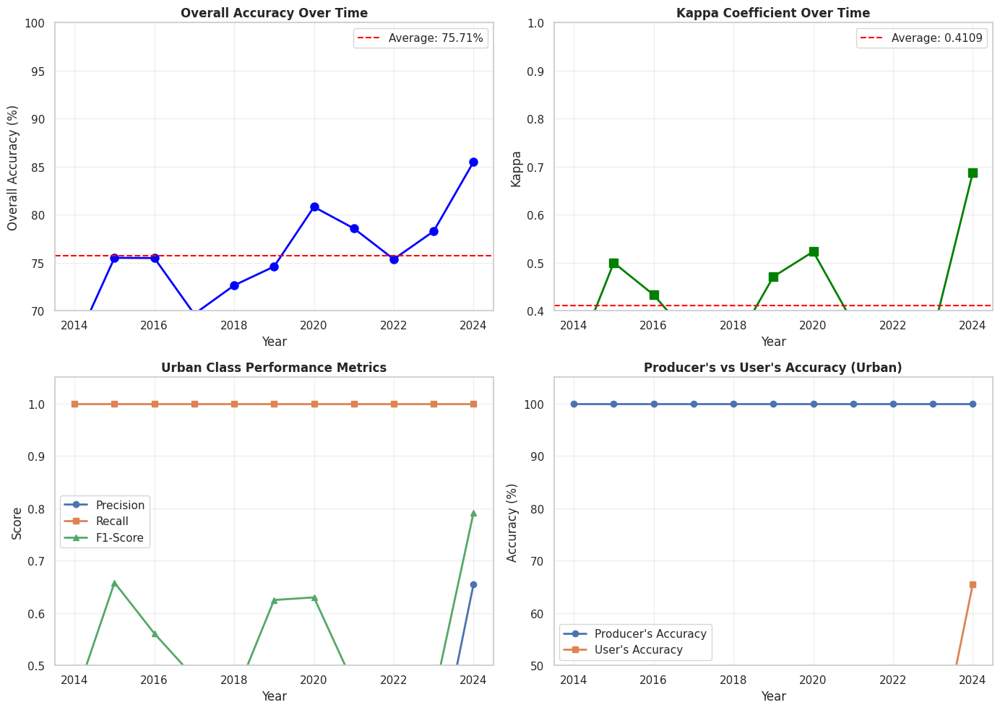

In [ ]:
# -------------------------------
# Visualization 1: Accuracy Metrics Over Time
# -------------------------------
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Plot 1: Overall Accuracy
axes[0, 0].plot(results_df['Year'], results_df['Overall_Accuracy']*100,
                marker='o', linewidth=2, markersize=8, color='blue')
axes[0, 0].axhline(y=avg_metrics['Overall_Accuracy']*100, color='red',
                   linestyle='--', label=f'Average: {avg_metrics["Overall_Accuracy"]*100:.2f}%')
axes[0, 0].set_title('Overall Accuracy Over Time', fontsize=12, fontweight='bold')
axes[0, 0].set_xlabel('Year')
axes[0, 0].set_ylabel('Overall Accuracy (%)')
axes[0, 0].grid(True, alpha=0.3)
axes[0, 0].legend()
axes[0, 0].set_ylim([70, 100])

# Plot 2: Kappa Coefficient
axes[0, 1].plot(results_df['Year'], results_df['Kappa'],
                marker='s', linewidth=2, markersize=8, color='green')
axes[0, 1].axhline(y=avg_metrics['Kappa'], color='red',
                   linestyle='--', label=f'Average: {avg_metrics["Kappa"]:.4f}')
axes[0, 1].set_title('Kappa Coefficient Over Time', fontsize=12, fontweight='bold')
axes[0, 1].set_xlabel('Year')
axes[0, 1].set_ylabel('Kappa')
axes[0, 1].grid(True, alpha=0.3)
axes[0, 1].legend()
axes[0, 1].set_ylim([0.4, 1.0])

# Plot 3: Precision, Recall, F1-Score
axes[1, 0].plot(results_df['Year'], results_df['Precision'],
                marker='o', linewidth=2, label='Precision')
axes[1, 0].plot(results_df['Year'], results_df['Recall'],
                marker='s', linewidth=2, label='Recall')
axes[1, 0].plot(results_df['Year'], results_df['F1_Score'],
                marker='^', linewidth=2, label='F1-Score')
axes[1, 0].set_title('Urban Class Performance Metrics', fontsize=12, fontweight='bold')
axes[1, 0].set_xlabel('Year')
axes[1, 0].set_ylabel('Score')
axes[1, 0].grid(True, alpha=0.3)
axes[1, 0].legend()
axes[1, 0].set_ylim([0.5, 1.05])

# Plot 4: Producer's vs User's Accuracy
axes[1, 1].plot(results_df['Year'], results_df['Producers_Accuracy']*100,
                marker='o', linewidth=2, label="Producer's Accuracy")
axes[1, 1].plot(results_df['Year'], results_df['Users_Accuracy']*100,
                marker='s', linewidth=2, label="User's Accuracy")
axes[1, 1].set_title("Producer's vs User's Accuracy (Urban)", fontsize=12, fontweight='bold')
axes[1, 1].set_xlabel('Year')
axes[1, 1].set_ylabel('Accuracy (%)')
axes[1, 1].grid(True, alpha=0.3)
axes[1, 1].legend()
axes[1, 1].set_ylim([50, 105])

plt.tight_layout()
plt.show()

/tmp/ipython-input-3250273210.py:12: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[0].boxplot([metrics_for_box.iloc[:, i] for i in range(5)],


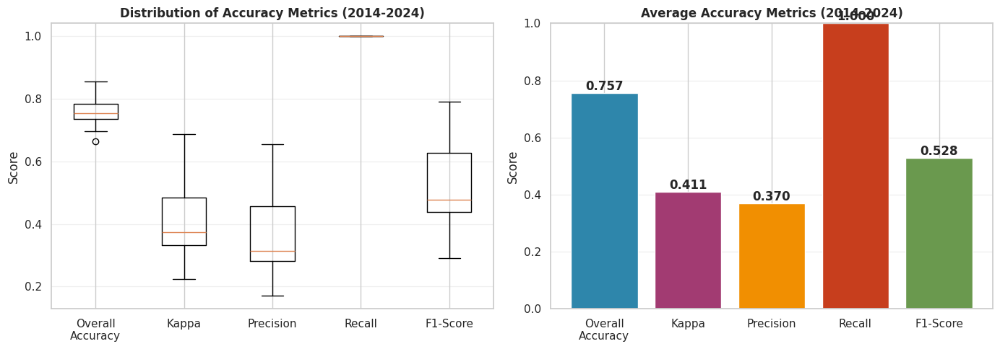

In [ ]:
# -------------------------------
# Visualization 2: Summary Statistics
# -------------------------------
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Box plot of key metrics
metrics_for_box = results_df[['Overall_Accuracy', 'Kappa', 'Precision',
                               'Recall', 'F1_Score']].copy()
metrics_for_box.columns = ['Overall\nAccuracy', 'Kappa', 'Precision',
                           'Recall', 'F1-Score']

axes[0].boxplot([metrics_for_box.iloc[:, i] for i in range(5)],
                labels=metrics_for_box.columns)
axes[0].set_title('Distribution of Accuracy Metrics (2014-2024)',
                  fontsize=12, fontweight='bold')
axes[0].set_ylabel('Score')
axes[0].grid(True, alpha=0.3, axis='y')

# Bar chart of average metrics
metrics_names = ['Overall\nAccuracy', 'Kappa', 'Precision', 'Recall', 'F1-Score']
metrics_values = [avg_metrics['Overall_Accuracy'], avg_metrics['Kappa'],
                  avg_metrics['Precision'], avg_metrics['Recall'],
                  avg_metrics['F1_Score']]

bars = axes[1].bar(metrics_names, metrics_values, color=['#2E86AB', '#A23B72',
                   '#F18F01', '#C73E1D', '#6A994E'])
axes[1].set_title('Average Accuracy Metrics (2014-2024)',
                  fontsize=12, fontweight='bold')
axes[1].set_ylabel('Score')
axes[1].set_ylim([0, 1])
axes[1].grid(True, alpha=0.3, axis='y')

# Add value labels on bars
for bar in bars:
    height = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.3f}', ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()

In [ ]:
# -------------------------------
# Save results to CSV
# -------------------------------
results_df.to_csv('accuracy_assessment_results.csv', index=False)
print("\nResults saved to 'accuracy_assessment_results.csv'")

print("\n" + "="*80)
print("VALIDATION COMPLETE")
print("="*80)


Results saved to 'accuracy_assessment_results.csv'

VALIDATION COMPLETE
